# Importing The Packages

In [1]:
# Importing Packages 
import yfinance as yf
import pandas as pd
import numpy as np
import pandas_ta as ta
import talib
import plotly.graph_objects as go
from datetime import datetime
import hvplot.pandas
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Collecting and  preparing the data

In [2]:
# Downloading the data from yahoo finance
EURUSD_df = yf.download("EURUSD=X", start = '2006-9-14', end = None, group_by = "ticker")
USDJPY_df = yf.download(" USDJPY=X", start = '2006-9-14', end = None, group_by = "ticker")
GBPUSD_df = yf.download("GBPUSD=X", start = '2006-9-14', end = None)
USDCHF_df = yf.download("USDCHF=X", start = '2006-9-14', end = None)
USDJPY_df.tail()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-08-30,109.841003,109.956001,109.706001,109.864998,109.864998,0
2021-08-31,109.939003,110.067001,109.602997,109.944000,109.944000,0
2021-09-01,110.061996,110.410004,109.883003,110.056000,110.056000,0
2021-09-02,110.106003,110.106003,109.928001,110.096001,110.096001,0
2021-09-03,109.940002,110.072998,109.760002,110.010002,110.010002,0


In [3]:
# Getting the closing prices from de DataFrames for each currency
EURUSD_slice_df= EURUSD_df.loc[: , ['Close']].dropna()

GBPUSD_slice_df= GBPUSD_df.loc[: , ['Close']].dropna()

USDJPY_slice_df= USDJPY_df.loc[: , ['Close']].dropna()

USDCHF_slice_df= USDCHF_df.loc[: , ['Close']].dropna()


In [4]:
# Dropping "Volume" and "Adj Close"
EURUSD_df = EURUSD_df.drop(columns=["Adj Close", "Volume"])
GBPUSD_df = GBPUSD_df.drop(columns=["Adj Close", "Volume"])
USDJPY_df = USDJPY_df.drop(columns=["Adj Close", "Volume"])
USDCHF_df = USDCHF_df.drop(columns=["Adj Close", "Volume"])

In [5]:
# Reset the index in order of creating a candlestick bar chart
EURUSD_reset_index = EURUSD_df.reset_index()
EURUSD_reset_index.head() 

USDJPY_reset_index = USDJPY_df.reset_index()
USDJPY_reset_index.head() 

GBPUSD_reset_index = GBPUSD_df.reset_index()
GBPUSD_reset_index.head() 

USDCHF_reset_index = USDCHF_df.reset_index()
USDCHF_reset_index.head() 


,Date,Open,High,Low,Close
0,2006-09-14,1.24970,1.25280,1.2439,1.2526
1,2006-09-15,1.25240,1.26165,1.2514,1.2578
2,2006-09-18,1.25700,1.25780,1.2499,1.2502
3,2006-09-19,1.24990,1.25710,1.2482,1.2515
4,2006-09-20,1.25175,1.25325,1.2462,1.2509


# Creating the candlestick bar, RSI and Moving Averages indicators

In [6]:
# Calling RSI indicator from pandas_ta for EURUSD_df
EURUSD_df['RSI'] = EURUSD_df.ta.rsi().dropna()

# Calling RSI indicator from pandas_ta for USDJPY_df
USDJPY_df['RSI'] = USDJPY_df.ta.rsi().dropna()

# Calling RSI indicator from pandas_ta for GBPUSD_df
GBPUSD_df['RSI'] = GBPUSD_df.ta.rsi().dropna()

# Calling RSI indicator from pandas_ta for USDCHF_df
USDCHF_df['RSI'] = USDCHF_df.ta.rsi().dropna()

In [7]:
# Creating the reversal patterns of the hammer and the shooting star for each currency
EURUSD_df['shooting_star_eurusd'] = talib.CDLSHOOTINGSTAR(EURUSD_df['Open'],EURUSD_df['High'],EURUSD_df['Low'] , EURUSD_df['Close'])
EURUSD_df['hammer_pattern_eurusd'] = talib.CDLHAMMER(EURUSD_df['Open'],EURUSD_df['High'],EURUSD_df['Low'] , EURUSD_df['Close'])

USDJPY_df['shooting_star_usdjpy'] = talib.CDLSHOOTINGSTAR(USDJPY_df['Open'],USDJPY_df['High'],USDJPY_df['Low'] , USDJPY_df['Close'])
USDJPY_df['hammer_pattern_usdjpy'] = talib.CDLHAMMER(USDJPY_df['Open'],USDJPY_df['High'],USDJPY_df['Low'] , USDJPY_df['Close'])

GBPUSD_df['shooting_star_gbpusd'] = talib.CDLSHOOTINGSTAR(GBPUSD_df['Open'],GBPUSD_df['High'],GBPUSD_df['Low'] , GBPUSD_df['Close'])
GBPUSD_df['hammer_pattern_gbpusd'] = talib.CDLHAMMER(GBPUSD_df['Open'],GBPUSD_df['High'],GBPUSD_df['Low'] , GBPUSD_df['Close'])

USDCHF_df['shooting_star_usdchf'] = talib.CDLSHOOTINGSTAR(USDCHF_df['Open'],USDCHF_df['High'],USDCHF_df['Low'] , USDCHF_df['Close'])
USDCHF_df['hammer_pattern_usdchf'] = talib.CDLHAMMER(USDCHF_df['Open'], USDCHF_df['High'],USDCHF_df['Low'] , USDCHF_df['Close'])

In [8]:
print(EURUSD_df[EURUSD_df['hammer_pattern_eurusd'] == 100])

                Open      High       Low     Close        RSI  \
Date                                                            
2006-10-04  1.273593  1.273902  1.267202  1.271294  49.113634   
2007-01-26  1.293594  1.294197  1.288793  1.292892  41.618246   
2007-02-22  1.313991  1.314199  1.308507  1.312508  58.358792   
2007-04-23  1.360507  1.360600  1.354793  1.358400  67.940473   
2007-06-13  1.330601  1.331593  1.326594  1.331009  32.702392   
...              ...       ...       ...       ...        ...   
2020-08-03  1.178411  1.178759  1.170138  1.178231  70.553828   
2020-09-02  1.192307  1.192435  1.182410  1.192321  62.560182   
2021-03-05  1.196859  1.196859  1.189796  1.196774  36.445145   
2021-08-10  1.173900  1.174399  1.171070  1.173847  34.321497   
2021-08-19  1.170385  1.170686  1.166875  1.170330  35.768693   

            shooting_star_eurusd  hammer_pattern_eurusd  
Date                                                     
2006-10-04                     0      

In [9]:
# Set the short window and long windows
short_window = 50
long_window = 100

In [10]:
# Generate the short and long moving averages (50 and 100 days, respectively) for each currency
#EURUSD_sma_df = pd.DataFrame()
EURUSD_df['SMA50'] = EURUSD_slice_df['Close'].rolling(window=short_window).mean()
EURUSD_df['SMA100'] = EURUSD_slice_df['Close'].rolling(window=long_window).mean()
EURUSD_df['SMA Cross'] = 0.0

# Generate the exit signal ,
# where 1 is the short-window (SMA50) greater than the long-window (SMA100)
# and 0 is when the condition is not met
EURUSD_df['SMA Cross'][short_window:] = np.where(
    EURUSD_df['SMA50'][short_window:] > EURUSD_df['SMA100'][short_window:], 1.0, 0.0
)

In [11]:
# Generate the short and long moving averages (50 and 100 days, respectively) for each currency

GBPUSD_df['SMA50'] = GBPUSD_slice_df['Close'].rolling(window=short_window).mean()
GBPUSD_df['SMA100'] = GBPUSD_slice_df['Close'].rolling(window=long_window).mean()
GBPUSD_df['SMA Cross'] = 0.0

# Generate the exit signal ,
# where 1 is the short-window (SMA50) greater than the long-window (SMA100)
# and 0 is when the condition is not met
GBPUSD_df['SMA Cross'][short_window:] = np.where(
    GBPUSD_df['SMA50'][short_window:] > GBPUSD_df['SMA100'][short_window:], 1.0, 0.0
)


In [12]:
# Generate the short and long moving averages (50 and 100 days, respectively) for each currency

USDJPY_df['SMA50'] = USDJPY_slice_df['Close'].rolling(window=short_window).mean()
USDJPY_df['SMA100'] = USDJPY_slice_df['Close'].rolling(window=long_window).mean()
USDJPY_df['SMA Cross'] = 0.0

# Generate the exit signal ,
# where 1 is the short-window (SMA50) greater than the long-window (SMA100)
# and 0 is when the condition is not met
USDJPY_df['SMA Cross'][short_window:] = np.where(
    USDJPY_df['SMA50'][short_window:] > USDJPY_df['SMA100'][short_window:], 1.0, 0.0
)

In [13]:
# Generate the short and long moving averages (50 and 100 days, respectively) for each currency

USDCHF_df['SMA50'] = USDCHF_slice_df['Close'].rolling(window=short_window).mean()
USDCHF_df['SMA100'] = USDCHF_slice_df['Close'].rolling(window=long_window).mean()
USDCHF_df['SMA Cross'] = 0.0

# Generate the exit signal ,
# where 1 is the short-window (SMA50) greater than the long-window (SMA100)
# and 0 is when the condition is not met
USDCHF_df['SMA Cross'][short_window:] = np.where(
    USDCHF_df['SMA50'][short_window:] > USDCHF_df['SMA100'][short_window:], 1.0, 0.0
)


# Generating the Signals

In [14]:
# Calculate the points in time when the Signal value changes
# Identify trade entry (1) and exit (-1) points
EURUSD_df['SMA Cross'] = EURUSD_df['SMA Cross'].diff()

In [15]:
# Calculate the points in time when the Signal value changes
# Identify trade entry (1) and exit (-1) points
GBPUSD_df['SMA Cross'] = GBPUSD_df['SMA Cross'].diff()

In [16]:
# Calculate the points in time when the Signal value changes
# Identify trade entry (1) and exit (-1) points
USDJPY_df['SMA Cross'] = USDJPY_df['SMA Cross'].diff()

In [17]:
# Calculate the points in time when the Signal value changes
# Identify trade entry (1) and exit (-1) points
USDCHF_df['SMA Cross'] = USDCHF_df['SMA Cross'].diff()

In [18]:
# Generate the trading signal for entries 0, buy, or sell

# when RSI is greater or equal than 60, shooting star shows up and there is a crossing between moving averages there is a sell signals 
# when RSI is lesser or equal than 40, hammer shows up and there is a crossing between moving averages there is a buy signal 
# and 0 when the condition is not met 
conditions_eurusd = [(EURUSD_df['RSI'] <=  60) &  (EURUSD_df['shooting_star_eurusd']  != 0) & (EURUSD_df["SMA Cross"] !=0)  , (EURUSD_df['RSI'] >=  40) &  (EURUSD_df['hammer_pattern_eurusd'] != 0) & (EURUSD_df["SMA Cross"] !=0) ] 
values = [-1.0, 1.0]

# buy = 1.0
# sell = -1.0
          
EURUSD_df["Signal"] = np.select(conditions_eurusd, values)
EURUSD_df.fillna(0)
print(EURUSD_df[EURUSD_df["Signal"] == 1])

Empty DataFrame
Columns: [Open, High, Low, Close, RSI, shooting_star_eurusd, hammer_pattern_eurusd, SMA50, SMA100, SMA Cross, Signal]
Index: []


In [19]:
# Generate the trading signal for entries 0, buy, or sell

# when RSI is greater or equal than 60, shooting star shows up and there is a crossing between moving averages there is a sell signals 
# when RSI is lesser or equal than 40, hammer shows up and there is a crossing between moving averages there is a buy signal 
# and 0 when the condition is not met 
conditions_usdjpy = [(USDJPY_df['RSI'] <=  60) &  (USDJPY_df['shooting_star_usdjpy']  != 0) & (USDJPY_df["SMA Cross"] !=0)  , (USDJPY_df['RSI'] >=  40) &  (USDJPY_df['hammer_pattern_usdjpy'] != 0) & (USDJPY_df["SMA Cross"] !=0) ]
values = [-1.0, 1.0]

# buy = 1.0
# sell = -1

USDJPY_df["Signal"] = np.select(conditions_usdjpy, values)
USDJPY_df.fillna(0)
print(USDJPY_df[USDJPY_df["Signal"] == 1])

                  Open        High         Low       Close        RSI  \
Date                                                                    
2013-11-05   98.629997   98.634003   98.169998   98.626999  54.911728   
2017-07-12  113.767998  113.792000  112.939499  113.748001  65.660812   

            shooting_star_usdjpy  hammer_pattern_usdjpy      SMA50     SMA100  \
Date                                                                            
2013-11-05                     0                    100   98.48844   98.50357   
2017-07-12                     0                    100  111.79348  111.76857   

            SMA Cross  Signal  
Date                           
2013-11-05       -1.0     1.0  
2017-07-12        1.0     1.0  


In [20]:
# Generate the trading signal for entries 0, buy, or sell

# when RSI is greater or equal than 60, shooting star shows up and there is a crossing between moving averages there is a sell signals 
# when RSI is lesser or equal than 40, hammer shows up and there is a crossing between moving averages there is a buy signal 
# and 0 when the condition is not met 
conditions_gbpusd = [(GBPUSD_df['RSI'] <=  60) &  (GBPUSD_df['shooting_star_gbpusd']  != 0) & (GBPUSD_df["SMA Cross"] !=0)  , (GBPUSD_df['RSI'] >=  40) &  (GBPUSD_df['hammer_pattern_gbpusd'] != 0) & (GBPUSD_df["SMA Cross"] !=0) ]
values = [-1.0, 1.0]

# buy = 1.0
GBPUSD_df["Signal"] = np.select(conditions_gbpusd, values)
GBPUSD_df.fillna(0)
print(GBPUSD_df[GBPUSD_df["Signal"] == 1])

Empty DataFrame
Columns: [Open, High, Low, Close, RSI, shooting_star_gbpusd, hammer_pattern_gbpusd, SMA50, SMA100, SMA Cross, Signal]
Index: []


In [21]:
# Generate the trading signal for entries 0, buy, or sell

# when RSI is greater or equal than 60, shooting star shows up and there is a crossing between moving averages there is a sell signals 
# when RSI is lesser or equal than 40, hammer shows up and there is a crossing between moving averages there is a buy signal 
# and 0 when the condition is not met 
conditions_usdchf = [(USDCHF_df['RSI'] <=  60) &  (USDCHF_df['shooting_star_usdchf']  != 0) & (USDCHF_df["SMA Cross"] !=0)  , (USDCHF_df['RSI'] >=  40) &  (USDCHF_df['hammer_pattern_usdchf'] != 0) & (USDCHF_df["SMA Cross"] !=0) ]
values = [-1.0, 1.0]

# buy = 1.0
USDCHF_df["Signal"] = np.select(conditions_usdchf, values)
USDCHF_df.fillna(0)
print(USDCHF_df[USDCHF_df["Signal"] == 1])

Empty DataFrame
Columns: [Open, High, Low, Close, RSI, shooting_star_usdchf, hammer_pattern_usdchf, SMA50, SMA100, SMA Cross, Signal]
Index: []


In [22]:
# Joining the DataFrame
EURUSD_df["Signal1"] = EURUSD_df["Signal"] + EURUSD_df["SMA Cross"]
EURUSD_df["Signal1"].unique()

array([nan,  0.,  1., -1., -2.])

In [23]:
# Joining the DataFrame
GBPUSD_df["Signal1"] = GBPUSD_df["Signal"] + GBPUSD_df["SMA Cross"]
GBPUSD_df["Signal1"].unique()

array([nan,  0.,  1., -1.])

In [24]:
# Joining the DataFrame
USDJPY_df["Signal1"] = USDJPY_df["Signal"] + USDJPY_df["SMA Cross"]
USDJPY_df["Signal1"].unique()

array([nan,  0.,  1., -1., -2.,  2.])

In [25]:
# Joining the DataFrame
USDCHF_df["Signal1"] = USDCHF_df["Signal"] + USDCHF_df["SMA Cross"]
USDCHF_df["Signal1"].unique()

array([nan,  0.,  1., -1.])

# Plotting Candlestick bar chart for every Major Pairs of currencies

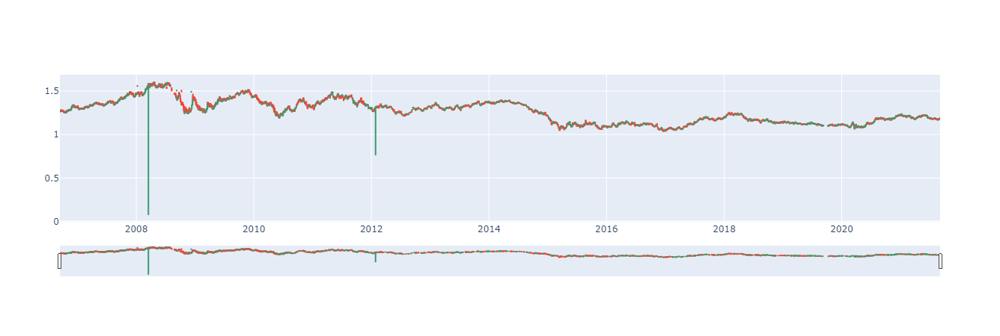

In [26]:
# Plotting Candlestick bar chart for EURUSD
EURUSD_candlestick_plot = go.Figure(data=[go.Candlestick(x=EURUSD_reset_index ['Date'],
                                             open=EURUSD_df['Open'], 
                                             high=EURUSD_df['High'], 
                                             low=EURUSD_df['Low'], 
                                             close=EURUSD_df['Close'])])

EURUSD_candlestick_plot.show()

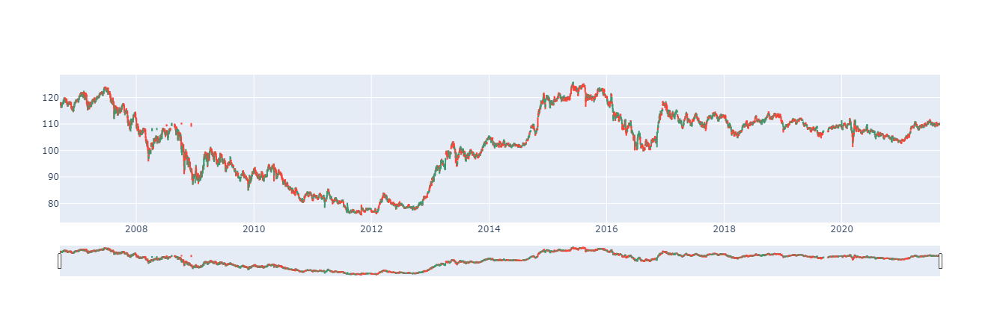

In [27]:
# Plotting Candlestick bar chart for USDJPY
USDJPY_candlestick_plot = go.Figure(data=[go.Candlestick(x=USDJPY_reset_index ['Date'],
                                             open=USDJPY_df['Open'], 
                                             high=USDJPY_df['High'], 
                                             low=USDJPY_df['Low'], 
                                             close=USDJPY_df['Close'])])

USDJPY_candlestick_plot.show()

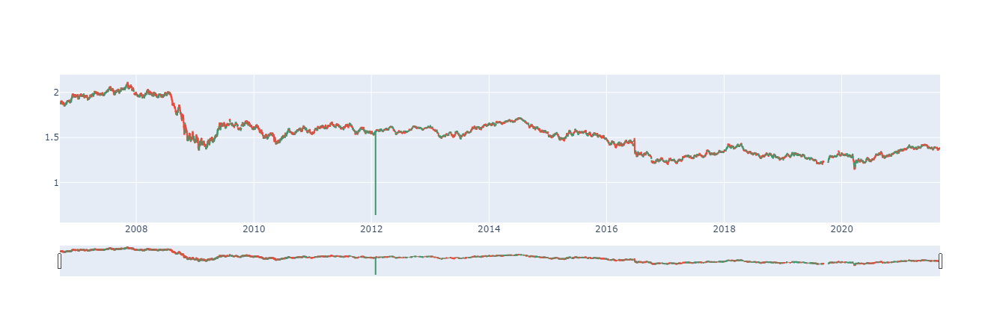

In [28]:
# Plotting Candlestick bar chart for GBPUSD
GBPUSD_candlestick_plot = go.Figure(data=[go.Candlestick(x=GBPUSD_reset_index ['Date'],
                                             open=GBPUSD_df['Open'], 
                                             high=GBPUSD_df['High'], 
                                             low=GBPUSD_df['Low'], 
                                             close=GBPUSD_df['Close'])])

GBPUSD_candlestick_plot .show()

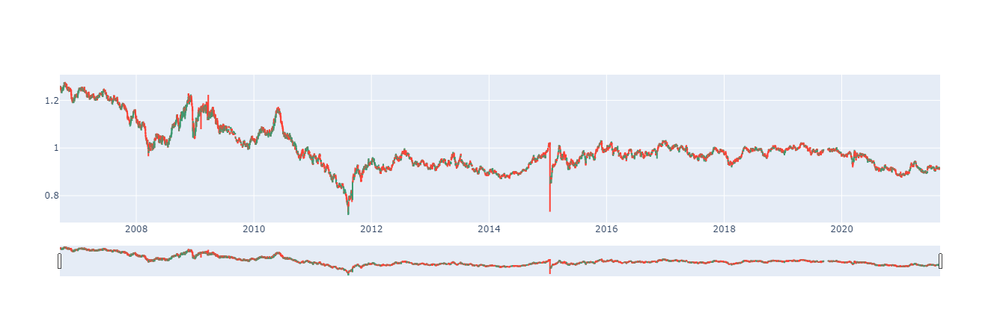

In [29]:
# Plotting Candlestick bar chart for USDCHF
USDCHF_candlestick_plot = go.Figure(data=[go.Candlestick(x=USDCHF_reset_index ['Date'],
                                             open=USDCHF_df['Open'], 
                                             high=USDCHF_df['High'], 
                                             low=USDCHF_df['Low'], 
                                             close=USDCHF_df['Close'])])

USDCHF_candlestick_plot.show()

# Calculating the correlation and the daily return between the currencies

In [30]:
# Adding currency colums
# Modyfy names for a colunms for indexes to be able to merge dataframes
# Display resulting dataframes
EURUSD_slice_df
EURUSD_slice_df['Currency'] = "EURUSD"
EURUSD_slice_df.tail()

GBPUSD_slice_df['Currency'] = "GBPUSD"
GBPUSD_slice_df.tail()

USDJPY_slice_df['Currency'] = "USDJPY"
USDJPY_slice_df.tail()

USDCHF_slice_df['Currency'] = "USDCHF"
USDCHF_slice_df.tail()

,Close,Currency
Date,,
2021-08-30,0.911200,USDCHF
2021-08-31,0.917180,USDCHF
2021-09-01,0.915300,USDCHF
2021-09-02,0.915517,USDCHF
2021-09-03,0.914010,USDCHF


In [31]:
# Create a list holdinfall of the assets
closing_prices = [EURUSD_slice_df, USDJPY_slice_df, GBPUSD_slice_df, USDCHF_slice_df]

In [32]:
# Convert the list called cloclosing_prices into a dataframe using the function .concat()
closing_prices_concat_df = pd.concat(closing_prices)
closing_prices_concat_df.head()

,Close,Currency
Date,,
2006-09-14,1.272297,EURUSD
2006-09-15,1.265102,EURUSD
2006-09-18,1.270696,EURUSD
2006-09-19,1.267700,EURUSD
2006-09-20,1.268794,EURUSD


In [33]:
# # Use Pandas `pivot` function to unify columns
closing_prices_df = closing_prices_concat_df.pivot(columns="Currency")
closing_prices_df.head().dropna()

Close                              
Currency      EURUSD    GBPUSD  USDCHF      USDJPY
Date                                              
2006-09-14  1.272297  1.885903  1.2526  117.570000
2006-09-15  1.265102  1.877899  1.2578  117.470001
2006-09-18  1.270696  1.881184  1.2502  117.889999
2006-09-19  1.267700  1.881786  1.2515  117.599998
2006-09-20  1.268794  1.887291  1.2509  117.459999

In [34]:
# Using dropna and pct_change function to find daily return on the portfolio
daily_return_of_the_currencies = closing_prices_df.pct_change().dropna()
daily_return_of_the_currencies.tail()

Close                              
Currency      EURUSD    GBPUSD    USDCHF    USDJPY
Date                                              
2021-08-30  0.003624  0.004423 -0.007343 -0.001663
2021-08-31 -0.000178 -0.000184  0.006563  0.000719
2021-09-01  0.001134 -0.000513 -0.002050  0.001019
2021-09-02  0.002593  0.001326  0.000237  0.000363
2021-09-03  0.003481  0.004663 -0.001646 -0.000781

In [35]:
# visualise daily returns `return_portfolio_df` dataframe with plot function overlaying all assets
#daily_return_of_the_currencies['Close'].hvplot(title = "Daily return", width = 1000, height=500)
daily_return_of_the_currencies['Close'].hvplot(kind = "box")

:BoxWhisker   [Variable]   (value)

The daily return measures the percentage of the increase or decrease of the investment between the closing price on the current day and that on the previous day. As we can see on the  plot USDJPY and EURUSD have the highest value which means they decrease increse or decrease the most. On the other hand GBPUSD has the lowest value for the daily return, so it's the one that has the increase or decrease the lowest.

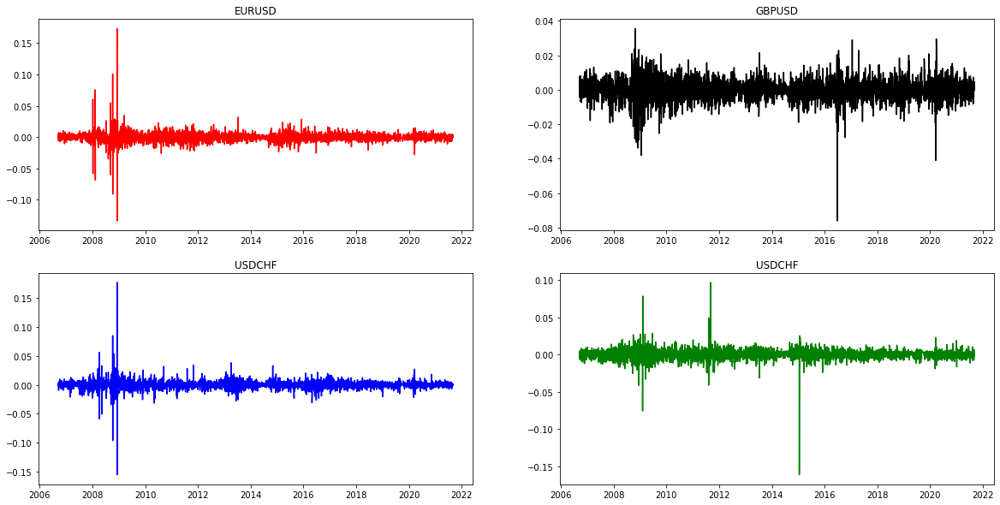

In [36]:
#visualize the data for currency on the separate graphs side by side

fig, axs = plt.subplots(2,2, figsize=(20,10))

axs[0,0].plot(daily_return_of_the_currencies['Close']['EURUSD'], c='r')
axs[0,0].set_title('EURUSD')
axs[0,1].plot(daily_return_of_the_currencies['Close']['GBPUSD'],c='k')
axs[0,1].set_title("GBPUSD")
axs[1,0].plot(daily_return_of_the_currencies['Close']['USDJPY'],c='b')
axs[1,0].set_title ('USDCHF')
axs[1,1].plot(daily_return_of_the_currencies['Close']['USDCHF'], c='g')
axs[1,1].set_title('USDCHF')
plt.show()

In [37]:
# Using 'describe' function generates summary statistics for a DataFrame.  
closing_prices_df.describe(include = "all")

Close                                       
Currency       EURUSD       GBPUSD       USDCHF       USDJPY
count     3860.000000  3872.000000  3873.000000  3860.000000
mean         1.260775     1.532868     0.995187   102.923822
std          0.128205     0.218792     0.094026    12.909300
min          1.039047     1.149439     0.722800    75.739998
25%          1.136913     1.332711     0.931100    93.567751
50%          1.266055     1.536452     0.975800   106.306999
75%          1.357220     1.623686     1.020800   111.724001
max          1.598798     2.108192     1.273400   125.628998

By inspecting these the four values for the standard deviation, we can observe that USDJPY has the largest number, or standard deviation. This means that of the four currency pairs, USDJPY individual returns deviate the most from its average return. That is, USDJPY is the most volatile currency and therefore the most risky. By contrast, USDCHF  has the smallest standard deviation, which indicates that it’s the least risky.

In [38]:
# Calculating the Correlation
correlation_currencies = daily_return_of_the_currencies.corr()
correlation_currencies


Close                              
Currency          EURUSD    GBPUSD    USDCHF    USDJPY
      Currency                                        
Close EURUSD    1.000000  0.466969 -0.505517  0.160801
      GBPUSD    0.466969  1.000000 -0.378902 -0.025759
      USDCHF   -0.505517 -0.378902  1.000000  0.267461
      USDJPY    0.160801 -0.025759  0.267461  1.000000

<AxesSubplot:xlabel='None-Currency', ylabel='None-Currency'>

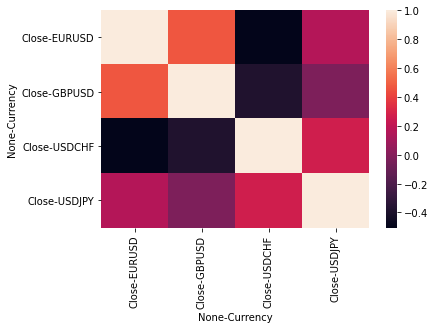

In [39]:
# Plotting the correlation calculation
sns.heatmap(correlation_currencies)

# Plotting signals

In [40]:
# Plotting Entry Signal for EURUSD
entry_buy_eurusd = EURUSD_df[EURUSD_df["Signal1"] == 1.0]['Close'].hvplot.scatter(
    color = "green",
    marker = "^",
    size = 100,
    legend=False,
    ylabel='Price',
    width=1000,
    height=600)

entry_sell_eurusd = EURUSD_df[EURUSD_df["Signal1"] == -1.0]['Close'].hvplot.scatter(
    color = "red",
    marker = "v",
    size = 100,
    legend=False,
    ylabel='Price',
    width=1000,
    height=600)

exit_eurusd = EURUSD_df[EURUSD_df['Signal1'] == 2]['Close'].hvplot.scatter(
      color = "black",
      marker = "v",
      size = 100,
      legend=False,
      ylabel='Price',
      width=1000,
      height=600)
                        
exi2t_eurusd = EURUSD_df[EURUSD_df['Signal1'] == -2]['Close'].hvplot.scatter(
      color = "black",
      marker = "v",
      size = 100,
      legend=False,
      ylabel='Price',
      width=1000,
      height=600)

EURUSD_plot = EURUSD_df[["Close"]].hvplot(
    ylabel = "Price",
    width = 1000,
    height = 400
)

 # Visualize the moving averages
moving_averages_eurusd = EURUSD_df[["SMA50", "SMA100"]].hvplot(
      ylabel='Price in $',
      width=1000,
      height=400
)

EURUSD_plot_and_entry = EURUSD_plot * entry_buy_eurusd * entry_sell_eurusd * exi2t_eurusd * moving_averages_eurusd
EURUSD_plot_and_entry.opts(title= "Entry and exit points base on RSI and Candlestick EURUSD")

:Overlay
   .Curve.I           :Curve   [Date]   (Close)
   .Scatter.Close.I   :Scatter   [Date]   (Close)
   .Scatter.Close.II  :Scatter   [Date]   (Close)
   .Scatter.Close.III :Scatter   [Date]   (Close)
   .NdOverlay.I       :NdOverlay   [Variable]
      :Curve   [Date]   (value)

In [41]:
# Plotting Entry Signal for GBPUSD
entry_buy_gbpusd = GBPUSD_df[GBPUSD_df["Signal1"] == 1.0]['Close'].hvplot.scatter(
    color = "green",
    marker = "^",
    size = 100,
    legend=False,
    ylabel='Price',
    width=1000,
    height=600)

entry_sell_gbpusd = GBPUSD_df[GBPUSD_df["Signal1"] == -1.0]['Close'].hvplot.scatter(
    color = "red",
    marker = "v",
    size = 100,
    legend=False,
    ylabel='Price',
    width=1000,
    height=600)

exit_gbpusd = GBPUSD_df[GBPUSD_df['Signal1'] == 2]['Close'].hvplot.scatter(
      color = "black",
      marker = "v",
      size = 100,
      legend=False,
      ylabel='Price',
      width=1000,
      height=600)
                        
exi2t_gbpusd = GBPUSD_df[GBPUSD_df['Signal1'] == -2]['Close'].hvplot.scatter(
      color = "black",
      marker = "v",
      size = 100,
      legend=False,
      ylabel='Price',
      width=1000,
      height=600)

GBPUSD_plot = GBPUSD_df[["Close"]].hvplot(
    ylabel = "Price",
    width = 1000,
    height = 400
)

 # Visualize the moving averages
moving_averages_gbpusd = GBPUSD_df[["SMA50", "SMA100"]].hvplot(
      ylabel='Price in $',
      width=1000,
      height=400
)

GBPUSD_plot_and_entry = GBPUSD_plot * entry_buy_gbpusd * entry_sell_gbpusd * exi2t_gbpusd * moving_averages_gbpusd
GBPUSD_plot_and_entry.opts(title= "Entry and exit points base on RSI and Candlestick GBPUSD")

:Overlay
   .Curve.I           :Curve   [Date]   (Close)
   .Scatter.Close.I   :Scatter   [Date]   (Close)
   .Scatter.Close.II  :Scatter   [Date]   (Close)
   .Scatter.Close.III :Scatter   [Date]   (Close)
   .NdOverlay.I       :NdOverlay   [Variable]
      :Curve   [Date]   (value)

In [42]:
# Plotting Entry Signal for USDJPY
entry_buy_usdjpy = USDJPY_df[USDJPY_df["Signal1"] == 1.0]['Close'].hvplot.scatter(
    color = "green",
    marker = "^",
    size = 100,
    legend=False,
    ylabel='Price',
    width=1000,
    height=600)

entry_sell_usdjpy = USDJPY_df[USDJPY_df["Signal1"] == -1.0]['Close'].hvplot.scatter(
    color = "red",
    marker = "v",
    size = 100,
    legend=False,
    ylabel='Price',
    width=1000,
    height=600)

exit_usdjpy = USDJPY_df[USDJPY_df['Signal1'] == 2]['Close'].hvplot.scatter(
      color = "black",
      marker = "v",
      size = 100,
      legend=False,
      ylabel='Price',
      width=1000,
      height=600)
                        
exi2t_usdjpy = USDJPY_df[USDJPY_df['Signal1'] == -2]['Close'].hvplot.scatter(
      color = "black",
      marker = "v",
      size = 100,
      legend=False,
      ylabel='Price',
      width=1000,
      height=600)

USDJPY_plot = USDJPY_df[["Close"]].hvplot(
    ylabel = "Price",
    width = 1000,
    height = 400
)

 # Visualize the moving averages
moving_averages_usdjpy = USDJPY_df[["SMA50", "SMA100"]].hvplot(
      ylabel='Price in $',
      width=1000,
      height=400
)

USDJPY_plot_and_entry = USDJPY_plot * entry_buy_usdjpy * entry_sell_usdjpy * exi2t_usdjpy * moving_averages_usdjpy
USDJPY_plot_and_entry.opts(title= "Entry and exit points base on RSI and Candlestick USDJPY")

:Overlay
   .Curve.I           :Curve   [Date]   (Close)
   .Scatter.Close.I   :Scatter   [Date]   (Close)
   .Scatter.Close.II  :Scatter   [Date]   (Close)
   .Scatter.Close.III :Scatter   [Date]   (Close)
   .NdOverlay.I       :NdOverlay   [Variable]
      :Curve   [Date]   (value)

In [43]:
# Plotting Entry Signal for USDCHF
entry_buy_usdchf = USDCHF_df[USDCHF_df["Signal1"] == 1.0]['Close'].hvplot.scatter(
    color = "green",
    marker = "^",
    size = 100,
    legend=False,
    ylabel='Price',
    width=1000,
    height=600)

entry_sell_usdchf = USDCHF_df[USDCHF_df["Signal1"] == -1.0]['Close'].hvplot.scatter(
    color = "red",
    marker = "v",
    size = 100,
    legend=False,
    ylabel='Price',
    width=1000,
    height=600)

exit_usdchf = USDCHF_df[USDCHF_df['Signal1'] == 2]['Close'].hvplot.scatter(
      color = "black",
      marker = "v",
      size = 100,
      legend=False,
      ylabel='Price',
      width=1000,
      height=600)
                        
exi2t_usdchf = USDCHF_df[USDCHF_df['Signal1'] == -2]['Close'].hvplot.scatter(
      color = "black",
      marker = "v",
      size = 100,
      legend=False,
      ylabel='Price',
      width=1000,
      height=600)

USDCHF_plot = USDCHF_df[["Close"]].hvplot(
    ylabel = "Price",
    width = 1000,
    height = 400
)

 # Visualize the moving averages
moving_averages_usdchf = USDCHF_df[["SMA50", "SMA100"]].hvplot(
      ylabel='Price in $',
      width=1000,
      height=400
)

USDCHF_plot_and_entry = USDCHF_plot * entry_buy_usdchf * entry_sell_usdchf * exi2t_usdchf * moving_averages_usdchf
USDCHF_plot_and_entry.opts(title= "Entry and exit points base on RSI and Candlestick USDCHF")

:Overlay
   .Curve.I           :Curve   [Date]   (Close)
   .Scatter.Close.I   :Scatter   [Date]   (Close)
   .Scatter.Close.II  :Scatter   [Date]   (Close)
   .Scatter.Close.III :Scatter   [Date]   (Close)
   .NdOverlay.I       :NdOverlay   [Variable]
      :Curve   [Date]   (value)

# Backtest the algorithm

### EURUSD

In [44]:
# Set the initial capital 
initial_capital = float(100000)

# Set the share size
share_size = 500

In [45]:
# Buy a 500 share position when the dual moving average crossover Signal equals 1 (SMA50 is greater than SMA100)
# Sell a 500 share position when the dual moving average crossover Signal equals 0 (SMA50 is less than SMA100)
EURUSD_df['Position'] = share_size * EURUSD_df['Signal1']

# Determine the points in time where a 500 share position is bought or sold
EURUSD_df['Entry/Exit Position'] = EURUSD_df['Position'].diff()

In [46]:
# Multiply the close price by the number of shares held, or the Position
EURUSD_df['Portfolio Holdings'] = EURUSD_df['Close'] * EURUSD_df['Position']

# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
EURUSD_df['Portfolio Cash'] = initial_capital - (EURUSD_df['Close'] * EURUSD_df['Entry/Exit Position']).cumsum()

# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
EURUSD_df['Portfolio Total'] = EURUSD_df['Portfolio Cash'] + EURUSD_df['Portfolio Holdings']

# Calculate the portfolio daily returns
EURUSD_df['Portfolio Daily Returns'] = EURUSD_df['Portfolio Total'].pct_change()

# Calculate the portfolio cumulative returns
EURUSD_df['Portfolio Cumulative Returns'] = (1 + EURUSD_df['Portfolio Daily Returns']).cumprod() - 1

print(EURUSD_df.tail(100))

                Open      High       Low     Close        RSI  \
Date                                                            
2021-04-19  1.196831  1.204819  1.194344  1.196945  57.662549   
2021-04-20  1.204384  1.208167  1.202877  1.204529  64.436801   
2021-04-21  1.203254  1.204529  1.200000  1.203239  62.602076   
2021-04-22  1.203818  1.207001  1.200394  1.203775  63.072483   
2021-04-23  1.201793  1.207799  1.201389  1.201475  59.607227   
...              ...       ...       ...       ...        ...   
2021-08-30  1.179997  1.181195  1.178453  1.179901  52.658831   
2021-08-31  1.179941  1.184553  1.179649  1.179690  52.342200   
2021-09-01  1.181195  1.186000  1.179510  1.181028  54.228467   
2021-09-02  1.184231  1.187225  1.183480  1.184091  58.298465   
2021-09-03  1.188072  1.188919  1.187648  1.188213  63.059779   

            shooting_star_eurusd  hammer_pattern_eurusd     SMA50    SMA100  \
Date                                                                       

In [47]:
#Create a column that holds the metrics of the trading algorithm
metrics = [
    'Annualized Return',
    'Cumulative Returns',
    'Annual Volatility',
    'Sharpe Ratio',
    'Sortino Ratio'
]

# Create a list that holds the column name
columns = ['Backtest EURUSD']

# Initialize the DataFrame with index set to evaluation metrics and columns 
evaluation_eurusd_df = pd.DataFrame(index=metrics, columns=columns)

# Calculate the annualized return metric
evaluation_eurusd_df.loc['Annualized Return'] = (EURUSD_df['Portfolio Daily Returns'].mean() * 252)

# Calculate the Cumulative returns metric
evaluation_eurusd_df.loc['Cumulative Returns'] = EURUSD_df['Portfolio Cumulative Returns'][-1]

# Calculate the Annual volatility metric
evaluation_eurusd_df.loc['Annual Volatility'] = (
    EURUSD_df['Portfolio Daily Returns'].std() * np.sqrt(252)
)



# Calculate the Sharpe ratio
evaluation_eurusd_df.loc['Sharpe Ratio'] = (
     EURUSD_df['Portfolio Daily Returns'].mean() * 252) / (EURUSD_df['Portfolio Daily Returns'].std() * np.sqrt(252)
)


In [48]:
# Calculate the Sortino ratio
# Start by calculating the downside return values

# Create a DataFrame that contains the Portfolio Daily Returns column
sortino_ratio_df = EURUSD_df[['Portfolio Daily Returns']]

# Create a column to hold downside return values
sortino_ratio_df.loc[:,'Downside Returns'] = 0

# Find Portfolio Daily Returns values less than 0, 
# square those values, and add them to the Downside Returns column
sortino_ratio_df.loc[sortino_ratio_df['Portfolio Daily Returns'] < 0, 
                     'Downside Returns'] = sortino_ratio_df['Portfolio Daily Returns']**2

# Calculate the annualized return value
annualized_return = sortino_ratio_df['Portfolio Daily Returns'].mean() * 252

# Calculate the annualized downside standard deviation value
downside_standard_deviation = np.sqrt(sortino_ratio_df['Downside Returns'].mean()) * np.sqrt(252)

# Divide the annualized return value by the downside standard deviation value
sortino_ratio = annualized_return/downside_standard_deviation

# Add the Sortino ratio to the evaluation DataFrame
evaluation_eurusd_df.loc['Sortino Ratio'] = sortino_ratio

evaluation_eurusd_df

,Backtest EURUSD
Annualized Return,2.50954e-05
Cumulative Returns,0.000384144
Annual Volatility,6.13866e-05
Sharpe Ratio,0.408808
Sortino Ratio,1.38934


### GBPUSD

In [49]:
# Buy a 500 share position when the dual moving average crossover Signal equals 1 (SMA50 is greater than SMA100)
# Sell a 500 share position when the dual moving average crossover Signal equals 0 (SMA50 is less than SMA100)
GBPUSD_df['Position'] = share_size * GBPUSD_df['Signal1']

# Determine the points in time where a 500 share position is bought or sold
GBPUSD_df['Entry/Exit Position'] = GBPUSD_df['Position'].diff()

# Multiply the close price by the number of shares held, or the Position
GBPUSD_df['Portfolio Holdings'] = GBPUSD_df['Close'] * GBPUSD_df['Position']

# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
GBPUSD_df['Portfolio Cash'] = initial_capital - (GBPUSD_df['Close'] * GBPUSD_df['Entry/Exit Position']).cumsum()

# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
GBPUSD_df['Portfolio Total'] = GBPUSD_df['Portfolio Cash'] + GBPUSD_df['Portfolio Holdings']

# Calculate the portfolio daily returns
GBPUSD_df['Portfolio Daily Returns'] = GBPUSD_df['Portfolio Total'].pct_change()

# Calculate the portfolio cumulative returns
GBPUSD_df['Portfolio Cumulative Returns'] = (1 + GBPUSD_df['Portfolio Daily Returns']).cumprod() - 1

#Create a column that holds the metrics of the trading algorithm
metrics_gbpusd = [
    'Annualized Return',
    'Cumulative Returns',
    'Annual Volatility',
    'Sharpe Ratio',
    'Sortino Ratio'
]

# Create a list that holds the column name
columns_gbpusd = ['Backtest GBPUSD']

# Initialize the DataFrame with index set to evaluation metrics and columns 
evaluation_gbpusd_df = pd.DataFrame(index=metrics, columns=columns_gbpusd)

# Calculate the annualized return metric
evaluation_gbpusd_df.loc['Annualized Return'] = (GBPUSD_df['Portfolio Daily Returns'].mean() * 252)

# Calculate the Cumulative returns metric
evaluation_gbpusd_df.loc['Cumulative Returns'] = GBPUSD_df['Portfolio Cumulative Returns'][-1]

# Calculate the Annual volatility metric
evaluation_gbpusd_df.loc['Annual Volatility'] = (
    GBPUSD_df['Portfolio Daily Returns'].std() * np.sqrt(252)
)



# Calculate the Sharpe ratio
evaluation_gbpusd_df.loc['Sharpe Ratio'] = (
     GBPUSD_df['Portfolio Daily Returns'].mean() * 252) / (GBPUSD_df['Portfolio Daily Returns'].std() * np.sqrt(252)
)

# Calculate the Sortino ratio
# Start by calculating the downside return values

# Create a DataFrame that contains the Portfolio Daily Returns column
sortino_ratio_gbpusd_df = GBPUSD_df[['Portfolio Daily Returns']]

# Create a column to hold downside return values
sortino_ratio_gbpusd_df.loc[:,'Downside Returns'] = 0

# Find Portfolio Daily Returns values less than 0, 
# square those values, and add them to the Downside Returns column
sortino_ratio_gbpusd_df.loc[sortino_ratio_gbpusd_df['Portfolio Daily Returns'] < 0, 
                     'Downside Returns'] = sortino_ratio_gbpusd_df['Portfolio Daily Returns']**2

# Calculate the annualized return value
annualized_return_gbpusd = sortino_ratio_gbpusd_df['Portfolio Daily Returns'].mean() * 252

# Calculate the annualized downside standard deviation value
downside_standard_deviation_gbpusd = np.sqrt(sortino_ratio_gbpusd_df['Downside Returns'].mean()) * np.sqrt(252)

# Divide the annualized return value by the downside standard deviation value
sortino_ratio_gbpusd = annualized_return_gbpusd/downside_standard_deviation_gbpusd

# Add the Sortino ratio to the evaluation DataFrame
evaluation_gbpusd_df.loc['Sortino Ratio'] = sortino_ratio_gbpusd

evaluation_gbpusd_df

,Backtest GBPUSD
Annualized Return,1.63835e-05
Cumulative Returns,0.000251533
Annual Volatility,7.03433e-05
Sharpe Ratio,0.232908
Sortino Ratio,0.344531


### USDJPY

In [50]:
# Buy a 500 share position when the dual moving average crossover Signal equals 1 (SMA50 is greater than SMA100)
# Sell a 500 share position when the dual moving average crossover Signal equals 0 (SMA50 is less than SMA100)
USDJPY_df['Position'] = share_size * USDJPY_df['Signal1']

# Determine the points in time where a 500 share position is bought or sold
USDJPY_df['Entry/Exit Position'] = USDJPY_df['Position'].diff()

# Multiply the close price by the number of shares held, or the Position
USDJPY_df['Portfolio Holdings'] = USDJPY_df['Close'] * USDJPY_df['Position']

# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
USDJPY_df['Portfolio Cash'] = initial_capital - (USDJPY_df['Close'] * USDJPY_df['Entry/Exit Position']).cumsum()

# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
USDJPY_df['Portfolio Total'] = USDJPY_df['Portfolio Cash'] + USDJPY_df['Portfolio Holdings']

# Calculate the portfolio daily returns
USDJPY_df['Portfolio Daily Returns'] = USDJPY_df['Portfolio Total'].pct_change()

# Calculate the portfolio cumulative returns
USDJPY_df['Portfolio Cumulative Returns'] = (1 + USDJPY_df['Portfolio Daily Returns']).cumprod() - 1

#Create a column that holds the metrics of the trading algorithm
metrics_usdjpy = [
    'Annualized Return',
    'Cumulative Returns',
    'Annual Volatility',
    'Sharpe Ratio',
    'Sortino Ratio'
]

# Create a list that holds the column name
columns_usdjpy = ['Backtest USDJPY']

# Initialize the DataFrame with index set to evaluation metrics and columns 
evaluation_usdjpy_df = pd.DataFrame(index=metrics, columns=columns_usdjpy)
# Calculate the annualized return metric
evaluation_usdjpy_df.loc['Annualized Return'] = (USDJPY_df['Portfolio Daily Returns'].mean() * 252)

# Calculate the Cumulative returns metric
evaluation_usdjpy_df.loc['Cumulative Returns'] = USDJPY_df['Portfolio Cumulative Returns'][-1]

# Calculate the Annual volatility metric
evaluation_usdjpy_df.loc['Annual Volatility'] = (
    USDJPY_df['Portfolio Daily Returns'].std() * np.sqrt(252)
)



# Calculate the Sharpe ratio
evaluation_usdjpy_df.loc['Sharpe Ratio'] = (
     USDJPY_df['Portfolio Daily Returns'].mean() * 252) / (USDJPY_df['Portfolio Daily Returns'].std() * np.sqrt(252)
)

# Calculate the Sortino ratio
# Start by calculating the downside return values

# Create a DataFrame that contains the Portfolio Daily Returns column
sortino_ratio_usdjpy_df = USDJPY_df[['Portfolio Daily Returns']]

# Create a column to hold downside return values
sortino_ratio_usdjpy_df.loc[:,'Downside Returns'] = 0

# Find Portfolio Daily Returns values less than 0, 
# square those values, and add them to the Downside Returns column
sortino_ratio_usdjpy_df.loc[sortino_ratio_usdjpy_df['Portfolio Daily Returns'] < 0, 
                     'Downside Returns'] = sortino_ratio_usdjpy_df['Portfolio Daily Returns']**2

# Calculate the annualized return value
annualized_return_usdjpy = sortino_ratio_usdjpy_df['Portfolio Daily Returns'].mean() * 252

# Calculate the annualized downside standard deviation value
downside_standard_deviation_usdjpy = np.sqrt(sortino_ratio_usdjpy_df['Downside Returns'].mean()) * np.sqrt(252)

# Divide the annualized return value by the downside standard deviation value
sortino_ratio_usdjpy = annualized_return_usdjpy/downside_standard_deviation_usdjpy

# Add the Sortino ratio to the evaluation DataFrame
evaluation_usdjpy_df.loc['Sortino Ratio'] = sortino_ratio_usdjpy

evaluation_usdjpy_df

,Backtest USDJPY
Annualized Return,0.00144081
Cumulative Returns,0.02205
Annual Volatility,0.00562827
Sharpe Ratio,0.255996
Sortino Ratio,0.426899


In [51]:
### USDCHF

In [52]:
# Buy a 500 share position when the dual moving average crossover Signal equals 1 (SMA50 is greater than SMA100)
# Sell a 500 share position when the dual moving average crossover Signal equals 0 (SMA50 is less than SMA100)
USDCHF_df['Position'] = share_size * USDCHF_df['Signal1']

# Determine the points in time where a 500 share position is bought or sold
USDCHF_df['Entry/Exit Position'] = USDCHF_df['Position'].diff()

# Multiply the close price by the number of shares held, or the Position
USDCHF_df['Portfolio Holdings'] = USDCHF_df['Close'] * USDCHF_df['Position']

# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
USDCHF_df['Portfolio Cash'] = initial_capital - (USDCHF_df['Close'] * USDCHF_df['Entry/Exit Position']).cumsum()

# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
USDCHF_df['Portfolio Total'] = USDCHF_df['Portfolio Cash'] + USDCHF_df['Portfolio Holdings']

# Calculate the portfolio daily returns
USDCHF_df['Portfolio Daily Returns'] = USDCHF_df['Portfolio Total'].pct_change()

# Calculate the portfolio cumulative returns
USDCHF_df['Portfolio Cumulative Returns'] = (1 + USDCHF_df['Portfolio Daily Returns']).cumprod() - 1

#Create a column that holds the metrics of the trading algorithm
metrics_usdchf = [
    'Annualized Return',
    'Cumulative Returns',
    'Annual Volatility',
    'Sharpe Ratio',
    'Sortino Ratio'
]

# Create a list that holds the column name
columns_usdchf = ['Backtest USDCHF']

# Initialize the DataFrame with index set to evaluation metrics and columns 
evaluation_usdchf_df = pd.DataFrame(index=metrics, columns=columns_usdchf)
# Calculate the annualized return metric
evaluation_usdchf_df.loc['Annualized Return'] = (USDCHF_df['Portfolio Daily Returns'].mean() * 252)

# Calculate the Cumulative returns metric
evaluation_usdchf_df.loc['Cumulative Returns'] = USDCHF_df['Portfolio Cumulative Returns'][-1]

# Calculate the Annual volatility metric
evaluation_usdchf_df.loc['Annual Volatility'] = (
    USDCHF_df['Portfolio Daily Returns'].std() * np.sqrt(252)
)



# Calculate the Sharpe ratio
evaluation_usdchf_df.loc['Sharpe Ratio'] = (
     USDCHF_df['Portfolio Daily Returns'].mean() * 252) / (USDCHF_df['Portfolio Daily Returns'].std() * np.sqrt(252)
)

# Calculate the Sortino ratio
# Start by calculating the downside return values

# Create a DataFrame that contains the Portfolio Daily Returns column
sortino_ratio_usdchf_df = USDCHF_df[['Portfolio Daily Returns']]

# Create a column to hold downside return values
sortino_ratio_usdchf_df.loc[:,'Downside Returns'] = 0

# Find Portfolio Daily Returns values less than 0, 
# square those values, and add them to the Downside Returns column
sortino_ratio_usdchf_df.loc[sortino_ratio_usdchf_df['Portfolio Daily Returns'] < 0, 
                     'Downside Returns'] = sortino_ratio_usdchf_df['Portfolio Daily Returns']**2

# Calculate the annualized return value
annualized_return_usdchf = sortino_ratio_usdchf_df['Portfolio Daily Returns'].mean() * 252

# Calculate the annualized downside standard deviation value
downside_standard_deviation_usdchf = np.sqrt(sortino_ratio_usdchf_df['Downside Returns'].mean()) * np.sqrt(252)

# Divide the annualized return value by the downside standard deviation value
sortino_ratio_usdchf = annualized_return_usdchf/downside_standard_deviation_usdchf

# Add the Sortino ratio to the evaluation DataFrame
evaluation_usdchf_df.loc['Sortino Ratio'] = sortino_ratio_usdchf

evaluation_usdchf_df

,Backtest USDCHF
Annualized Return,2.62409e-06
Cumulative Returns,4.02802e-05
Annual Volatility,4.99341e-05
Sharpe Ratio,0.0525511
Sortino Ratio,0.0677693


# Backtest for Google stock

In [53]:
# Downloading the data from yahoo finance
google_df = yf.download("GOOG", start = '2006-9-14', end = None)

[*********************100%***********************]  1 of 1 completed


In [54]:
# Getting the closing prices from de DataFrames
google_slice_df= google_df.loc[: , ['Close']].dropna()


In [55]:
# Dropping "Volume" and "Adj Close"
google_df = google_df.drop(columns=["Adj Close", "Volume"])

In [56]:
# Reset the index in order of creating a candlestick bar chart
google_reset_index = google_df.reset_index()

In [57]:
# Calling RSI indicator from pandas_ta for google_df
google_df['RSI'] = google_df.ta.rsi().dropna()

In [58]:
# Creating the reversal patterns of the hammer and the shooting star for each currency
google_df['shooting_star_google'] = talib.CDLSHOOTINGSTAR(google_df['Open'],google_df['High'],google_df['Low'] , google_df['Close'])
google_df['hammer_pattern_google'] = talib.CDLHAMMER(google_df['Open'],google_df['High'],google_df['Low'] , google_df['Close'])

In [59]:
# Generate the short and long moving averages (50 and 100 days, respectively) for google
google_df['SMA50'] = google_slice_df['Close'].rolling(window=short_window).mean()
google_df['SMA100'] = google_slice_df['Close'].rolling(window=long_window).mean()
google_df['SMA Cross'] = 0.0

# Generate the exit signal ,
# where 1 is the short-window (SMA50) greater than the long-window (SMA100)
# and 0 is when the condition is not met
google_df['SMA Cross'][short_window:] = np.where(
    google_df['SMA50'][short_window:] > google_df['SMA100'][short_window:], 1.0, 0.0
)

In [60]:
# Calculate the points in time when the Signal value changes
# Identify trade entry (1) and exit (-1) points
google_df['SMA Cross'] = google_df['SMA Cross'].diff()

In [61]:
# Generate the trading signal for entries 0, buy, or sell

# when RSI is greater or equal than 60, shooting star shows up and there is a crossing between moving averages there is a sell signals 
# when RSI is lesser or equal than 40, hammer shows up and there is a crossing between moving averages there is a buy signal 
# and 0 when the condition is not met 
conditions_google = [(google_df['RSI'] <=  60) &  (google_df['shooting_star_google']  != 0) & (google_df["SMA Cross"] !=0)  , (google_df['RSI'] >=  40) &  (google_df['hammer_pattern_google'] != 0) & (google_df["SMA Cross"] !=0) ] 
values = [-1.0, 1.0]

# buy = 1.0
# sell = -1.0
          
google_df["Signal"] = np.select(conditions_google, values)
google_df.fillna(0)

,Open,High,Low,Close,RSI,shooting_star_google,hammer_pattern_google,SMA50,SMA100,SMA Cross,Signal
Date,,,,,,,,,,,
2006-09-14,201.395126,202.381424,200.214554,201.235718,0.000000,0,0,0.000000,0.000000,0.0,0.0
2006-09-15,202.979187,204.259384,202.610565,204.174698,0.000000,0,0,0.000000,0.000000,0.0,0.0
2006-09-18,204.234482,208.563248,203.970474,206.570724,0.000000,0,0,0.000000,0.000000,0.0,0.0
2006-09-19,206.954285,206.969223,195.636703,201.151031,0.000000,0,0,0.000000,0.000000,0.0,0.0
2006-09-20,202.789886,202.934357,196.573196,197.758759,0.000000,0,0,0.000000,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2021-08-27,2842.250000,2900.219971,2840.399902,2891.010010,74.105883,0,0,2676.462202,2523.963599,0.0,0.0
2021-08-30,2894.090088,2929.790039,2892.000000,2909.389893,75.698476,-100,0,2684.422998,2530.403098,0.0,0.0
2021-08-31,2917.689941,2922.239990,2900.000000,2909.239990,75.657606,0,0,2692.025796,2536.636699,0.0,0.0


In [62]:
# Joining the DataFrame
google_df["Signal1"] = google_df["Signal"] + google_df["SMA Cross"]
google_df["Signal1"].unique()

array([nan,  0.,  1., -1.,  2.])

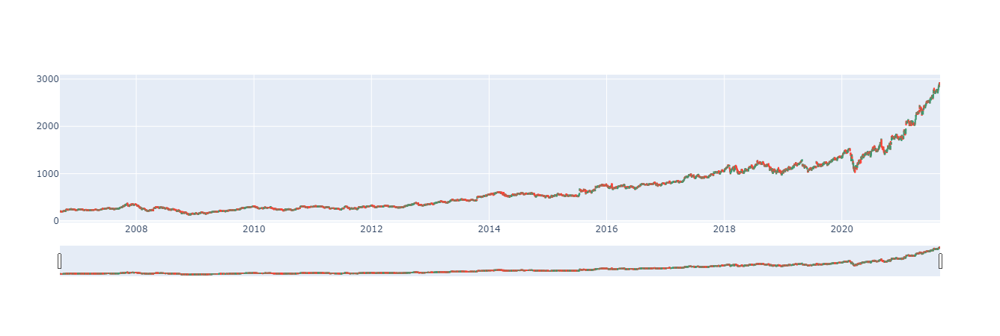

In [63]:
# Plotting Candlestick bar chart for EURUSD
google_candlestick_plot = go.Figure(data=[go.Candlestick(x=google_reset_index['Date'],
                                             open=google_df['Open'], 
                                             high=google_df['High'], 
                                             low=google_df['Low'], 
                                             close=google_df['Close'])])

google_candlestick_plot.show()

In [64]:
# Using 'describe' function generates summary statistics for a DataFrame.  
google_slice_df.describe()

,Close
count,3769.000000
mean,686.382113
std,535.695298
min,128.239334
25%,277.709076
50%,527.411987
75%,1020.909973
max,2916.840088


In [65]:
# Plotting Entry Signal for EURUSD
entry_buy_google = google_df[google_df["Signal1"] == 1.0]['Close'].hvplot.scatter(
    color = "green",
    marker = "^",
    size = 100,
    legend=False,
    ylabel='Price',
    width=1000,
    height=600)

entry_sell_google = google_df[google_df["Signal1"] == -1.0]['Close'].hvplot.scatter(
    color = "red",
    marker = "v",
    size = 100,
    legend=False,
    ylabel='Price',
    width=1000,
    height=600)

exit_google = google_df[google_df['Signal1'] == 2]['Close'].hvplot.scatter(
      color = "black",
      marker = "v",
      size = 100,
      legend=False,
      ylabel='Price',
      width=1000,
      height=600)
                        
exi2t_google = google_df[google_df['Signal1'] == -2]['Close'].hvplot.scatter(
      color = "black",
      marker = "v",
      size = 100,
      legend=False,
      ylabel='Price',
      width=1000,
      height=600)

google_plot = google_df[["Close"]].hvplot(
    ylabel = "Price",
    width = 1000,
    height = 400
)

 # Visualize the moving averages
moving_averages_google = google_df[["SMA50", "SMA100"]].hvplot(
      ylabel='Price in $',
      width=1000,
      height=400
)

google_plot_and_entry = google_plot * entry_buy_google * entry_sell_google * exi2t_google * moving_averages_google
google_plot_and_entry.opts(title= "Entry and exit points base on RSI and Candlestick for Google")

:Overlay
   .Curve.I           :Curve   [Date]   (Close)
   .Scatter.Close.I   :Scatter   [Date]   (Close)
   .Scatter.Close.II  :Scatter   [Date]   (Close)
   .Scatter.Close.III :Scatter   [Date]   (Close)
   .NdOverlay.I       :NdOverlay   [Variable]
      :Curve   [Date]   (value)

In [66]:
# Buy a 500 share position when the dual moving average crossover Signal equals 1 (SMA50 is greater than SMA100)
# Sell a 500 share position when the dual moving average crossover Signal equals 0 (SMA50 is less than SMA100)
google_df['Position'] = share_size * google_df['Signal1']

# Determine the points in time where a 500 share position is bought or sold
google_df['Entry/Exit Position'] = google_df['Position'].diff()

# Multiply the close price by the number of shares held, or the Position
google_df['Portfolio Holdings'] = google_df['Close'] * google_df['Position']

# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
google_df['Portfolio Cash'] = initial_capital - (google_df['Close'] * google_df['Entry/Exit Position']).cumsum()

# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
google_df['Portfolio Total'] = google_df['Portfolio Cash'] + google_df['Portfolio Holdings']

# Calculate the portfolio daily returns
google_df['Portfolio Daily Returns'] = google_df['Portfolio Total'].pct_change()

# Calculate the portfolio cumulative returns
google_df['Portfolio Cumulative Returns'] = (1 + google_df['Portfolio Daily Returns']).cumprod() - 1

#Create a column that holds the metrics of the trading algorithm
metrics_google = [
    'Annualized Return',
    'Cumulative Returns',
    'Annual Volatility',
    'Sharpe Ratio',
    'Sortino Ratio'
]

# Create a list that holds the column name
columns_google = ['Backtest GOOGLE']

# Initialize the DataFrame with index set to evaluation metrics and columns 
evaluation_google_df = pd.DataFrame(index=metrics, columns=columns_google)
# Calculate the annualized return metric
evaluation_google_df.loc['Annualized Return'] = (google_df['Portfolio Daily Returns'].mean() * 252)

# Calculate the Cumulative returns metric
evaluation_google_df.loc['Cumulative Returns'] = google_df['Portfolio Cumulative Returns'][-1]

# Calculate the Annual volatility metric
evaluation_google_df.loc['Annual Volatility'] = (
    google_df['Portfolio Daily Returns'].std() * np.sqrt(252)
)



# Calculate the Sharpe ratio
evaluation_google_df.loc['Sharpe Ratio'] = (
     google_df['Portfolio Daily Returns'].mean() * 252) / (google_df['Portfolio Daily Returns'].std() * np.sqrt(252)
)

# Calculate the Sortino ratio
# Start by calculating the downside return values

# Create a DataFrame that contains the Portfolio Daily Returns column
sortino_ratio_google_df = google_df[['Portfolio Daily Returns']]

# Create a column to hold downside return values
sortino_ratio_google_df.loc[:,'Downside Returns'] = 0

# Find Portfolio Daily Returns values less than 0, 
# square those values, and add them to the Downside Returns column
sortino_ratio_google_df.loc[sortino_ratio_google_df['Portfolio Daily Returns'] < 0, 
                     'Downside Returns'] = sortino_ratio_google_df['Portfolio Daily Returns']**2

# Calculate the annualized return value
annualized_return_google = sortino_ratio_google_df['Portfolio Daily Returns'].mean() * 252

# Calculate the annualized downside standard deviation value
downside_standard_deviation_google = np.sqrt(sortino_ratio_google_df['Downside Returns'].mean()) * np.sqrt(252)

# Divide the annualized return value by the downside standard deviation value
sortino_ratio_google = annualized_return_google/downside_standard_deviation_google

# Add the Sortino ratio to the evaluation DataFrame
evaluation_google_df.loc['Sortino Ratio'] = sortino_ratio_google

evaluation_google_df

,Backtest GOOGLE
Annualized Return,0.036597
Cumulative Returns,0.595288
Annual Volatility,0.109701
Sharpe Ratio,0.333606
Sortino Ratio,0.964155
